In [1]:
import cv2
import numpy as np
import os,sys,glob
import matplotlib.pyplot as plt
from methods import *
from utils import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# 项目简介

## 开发环境
Python版本为3.5，深度学习框架使用的是TensorFlow。

## 问题描述
目标是给定一张加入随机噪声的图片，恢复出原始图像。为了评估各种方法的优劣，我们需要自己构建数据和评测函数进行评估。
首先生成随机噪声。

In [2]:
generate_eval_data(0.4)
generate_eval_data(0.6)
generate_eval_data(0.8)

done!
done!
done!


# 具体实现
在本项目中，我实现了两种方法，均取得了较好的效果。

## KNN
首先实现的是KNN算法，作为baseline。
KNN算法即选取缺失像素最近的几个点，根据距离进行加权求和作为该点的颜色。
在图像修复问题中，KNN是一个非常自然的想法。

KNN的加权函数我使用了常用的距离倒数：$w=\frac{1}{Euclidean\ Distance}$。

为了选取最合适的邻近点数量，我评测了邻近点数量从1到10的表现。

1 2 3 4 5 6 7 8 9 10


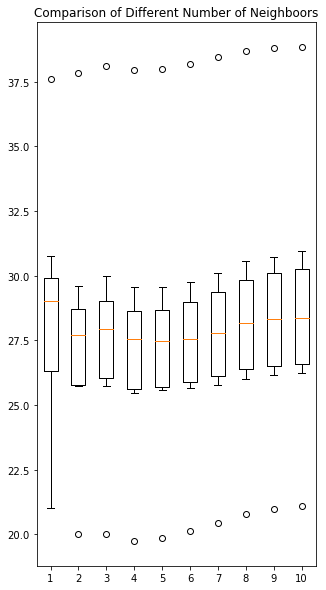

In [3]:
plot_data = []
for choose in range(1,11):
    print choose,
    scores = evaluate(0.6, KNN, (choose,))
    plot_data.append(scores)

fig = plt.figure(1, figsize=(5, 10))
ax = fig.add_subplot(111)
bp = ax.boxplot(plot_data)
plt.title('Comparison of Different Number of Neighboors')
plt.savefig('knn_param')

由上图可以看出，临近点为4-5时效果最好，因此之后均取值为4。

KNN算法虽然表现不错，但仍有一些缺点。
1. 最近邻距离非常远时效果很差（常出现在噪音比例非常高时）。
2. 只关注色彩信息，没有结构信息，边缘会出现模糊。
3. 只关注局部信息，没有针对图片全局的优化。
为了克服这些缺点，我使用了一种基于GAN的方法。

## General Deep Image Completion

### 网络结构
该方法是基于GAN实现的图像补全算法。该网络包含生成器$\mathcal G$和判别器$\mathcal D$两个部分，$\mathcal G$负责把缺失的图像补全为完整的图像，$\mathcal D$负责判断生成的图像是否真实。网络结构如下：
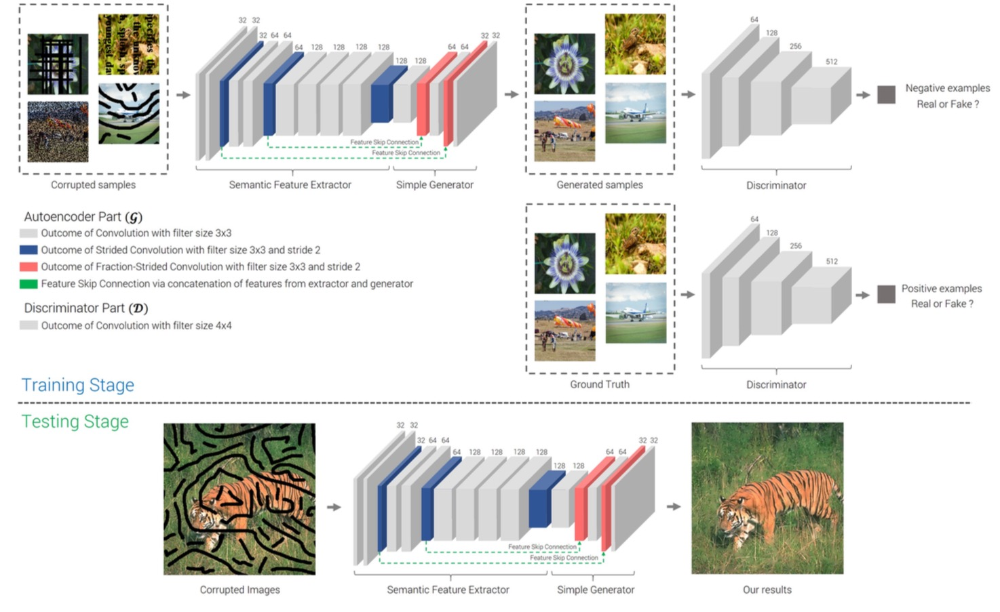

$\mathcal G$包含两个部分，语义提取及图像生成。可以注意到该网络的特点是非对称的encoder-decoder结构，在非对称设计中，decoder更容易训练，能够更好的保留图像语义信息。同时skip layer也提高了图像细节的保留度。

### 损失函数
Reconstruction Loss: 针对$\mathcal G$的生成效果，用于衡量与ground truth之间的差别。使用了$L1$ loss，$L1$ loss相比于 $L2$ loss能够产生更加真实的效果，因为$L2$ loss对于误判较大的像素惩罚力度更大，因此会更倾向于产生更模糊的图片。而在本次项目中，我们最终使用的是L2 loss来衡量图片生成结果。这导致了虽然该方法修复的图像十分真实，在视觉效果上与KNN相比具有显著的优势，但loss相比于KNN却没有明显的降低。

$$
\mathcal L_{rec}=\frac{1}{H\times W} \sum_x \sum_y || I_gt(x,y)-\mathcal G(I)(x,y) ||_1
$$

Adversarial Discriminator Loss: 该方法也采用了对抗训练，该项loss用于使判别器能够更好地分辨出真实图像和构造图像。从而为$\mathcal G$提供能够欺骗$\mathcal D$的梯度。

$$
\mathcal L_{adv_D}=\frac{1}{2}\times ||\mathcal G(I_gt)-1||_2+\frac{1}{2}\times ||\mathcal{D}(\mathcal{G}(I))-0||_2
$$

Adversarial Generator Loss: 该项Loss用于使生成器能够生成更加接近groud truth的图像。

$$
\mathcal L_{adv_G}=\frac{1}{2} \times ||\mathcal D(\mathcal G(I)) - 1||_2
$$

综上所述，最终的优化目标为：

$$
\mathcal G^*=arg\min_{\mathcal G, \mathcal D}\ \lambda_{\mathcal G}\mathcal L_{rec}+\lambda_{\mathcal D} \mathcal L_{adv_G} + \lambda_{\mathcal D}\mathcal L_{adv_D}
$$

# 实验结果

## KNN效果可视化
以噪音比例为0.6时为例。

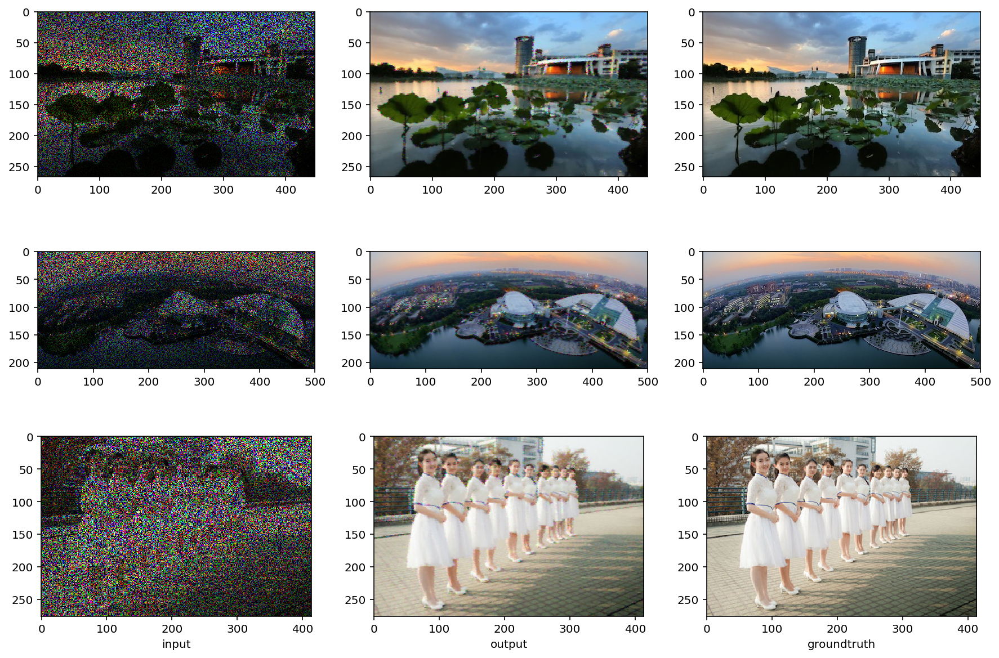

In [2]:
visual_sample(0.6, KNN, (4,));

## Deep Image Completion效果可视化
以噪音比例为0.6时为例。

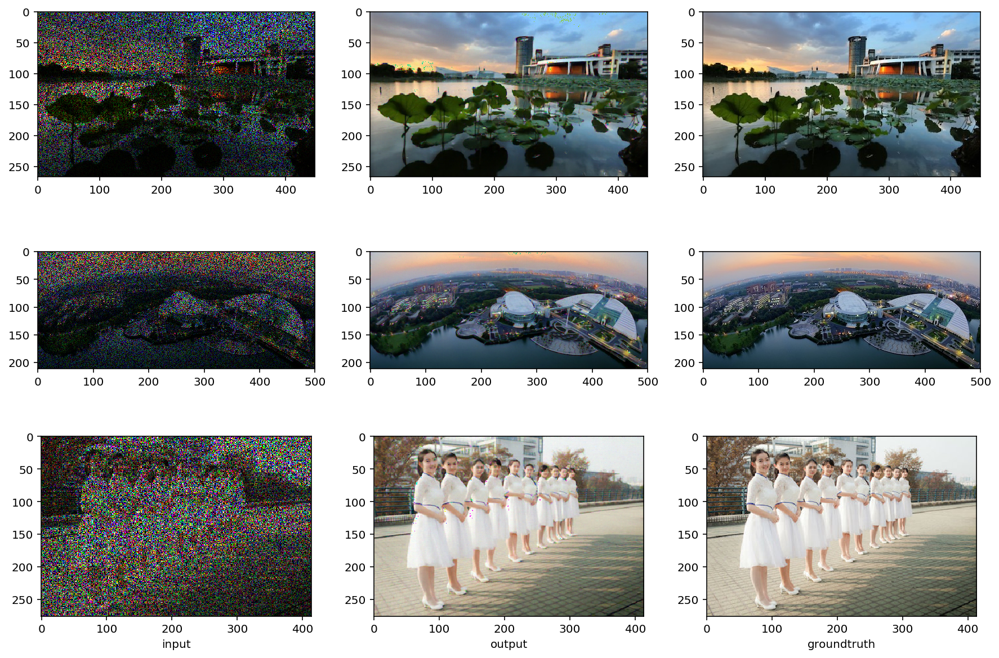

In [2]:
visual_sample(0.6, deep_image_completion,());

## KNN与Deep Image Completion效果对比
以下三幅图的噪音比例分别为0.4、0.6、0.8。

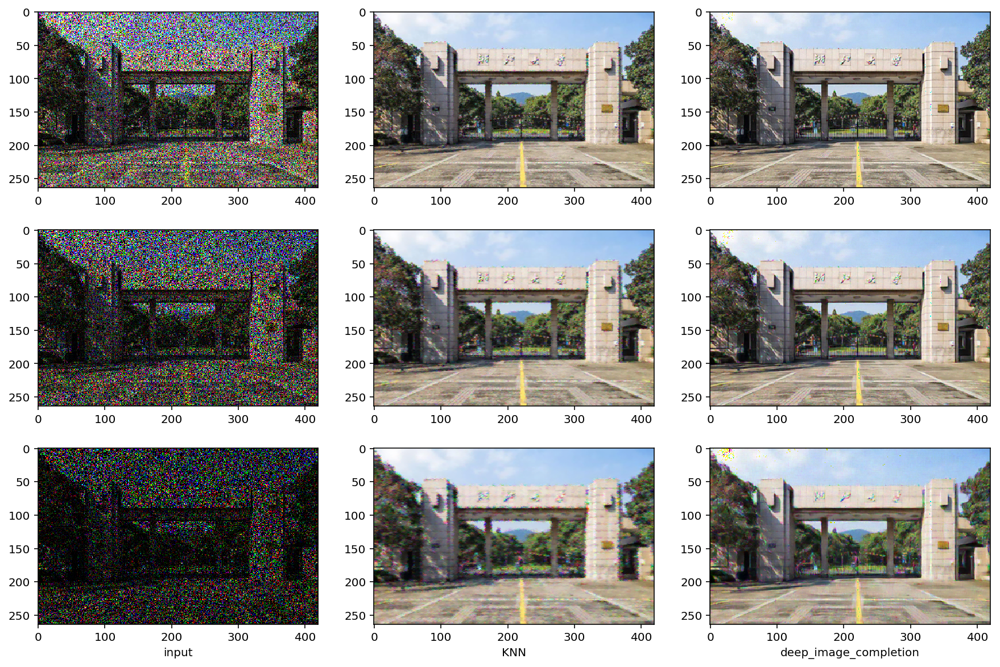

In [3]:
compare(KNN,(4,),deep_image_completion,());

## KNN与Deep Image Completion数值结果比较

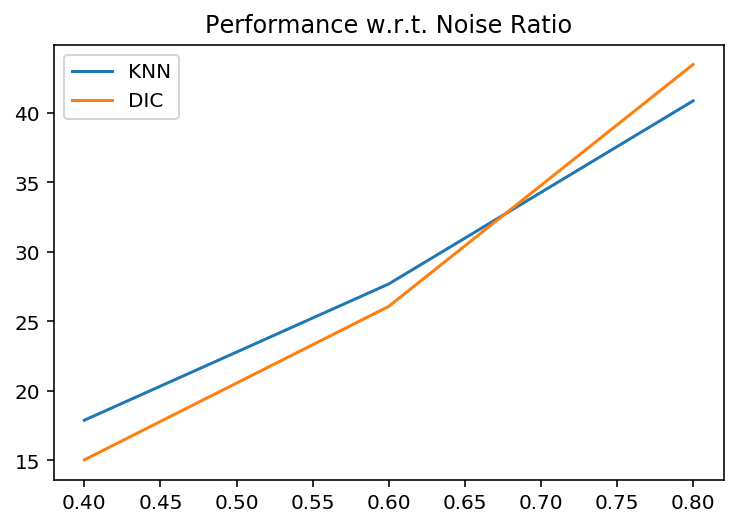

In [5]:
x = [0.4, 0.6, 0.8]
knn_data = []
gan_data = []
for ratio in x:
    knn_data.append(np.mean(evaluate(ratio, KNN, (4,))));
    gan_data.append(np.mean(evaluate(ratio, deep_image_completion, ())));
plt.plot(x, knn_data, label='KNN')
plt.plot(x, gan_data, label='DIC')
plt.legend()
plt.title('Performance w.r.t. Noise Ratio')

可以看出虽然Deep Image Completion视觉效果显著高于KNN，但数值结果并没有显著优势，甚至还在某些情况下略低。原因应该如前文所述，是评测用Loss与训练用Loss不同所致。训练所使用的Loss可以让图片看起来更真实。

# 生成Test图像
最后我们生成两种方法对应的测试图像，并选取Deep Image Completion的结果作为最终结果提交。

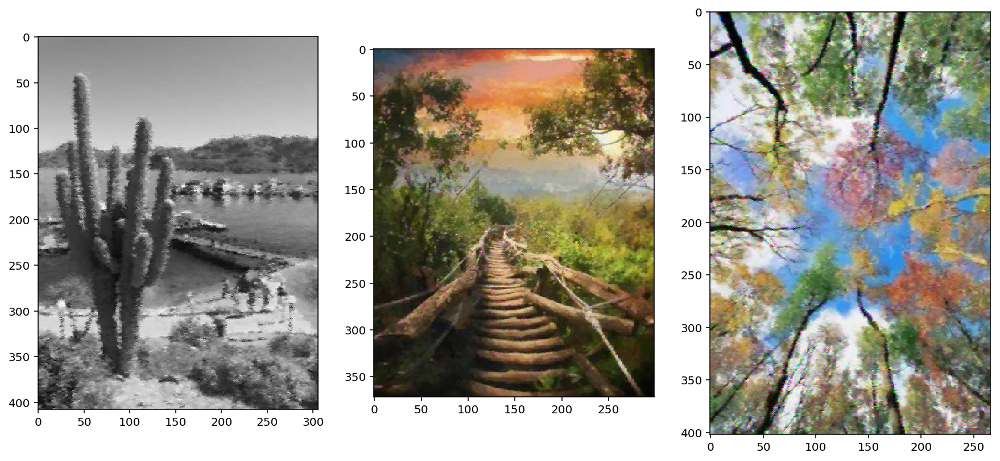

In [3]:
test(KNN,(4,))

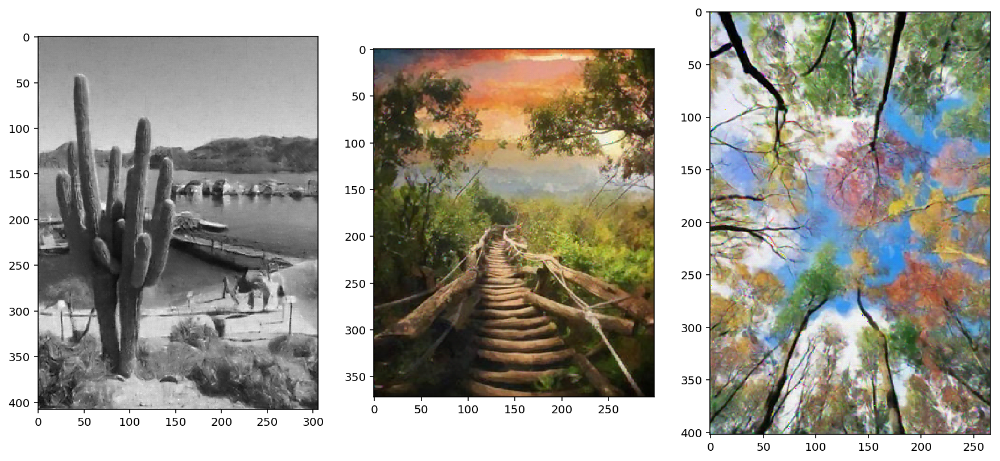

In [2]:
test(deep_image_completion,())

# 参考资料

Ching-Wei Tseng, Hung-Jin Lin, Shang-Hong Lai, General Deep Image Completion with Lightweight Conditional Generative Adversarial Networks, Proceedings of the British Machine Vision Conference